# Exploring the Data

## Table of Contents
* [Loading the Data](#loading_data)
* [Data Profiling](#data_profiling)
* [Missing values](#missing)
* [Outliers](#outliers)
* [Correlations](#corr)
* [Transformations identification](#transformations)

In [ ]:
# Libraries

%load_ext autoreload
%autoreload 2
%matplotlib inline

import os
import pandas as pd
import numpy as np
import datetime as dt
import gc
import missingno as msno
import pandas_profiling
import statsmodels as sm
from statsmodels.tsa.seasonal import seasonal_decompose
import random
import re

from src.functions import data_import as dimp
from src.functions import data_exploration as dexp
from src.functions import data_transformation as dtr

#visualization
import matplotlib.pyplot as plt
import seaborn as sns
import plotly as pty

import plotly.graph_objs as go
from plotly.subplots import make_subplots
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import cufflinks as cf
cf.set_config_file(offline=True)

## Loading the data
<a id="getting_data"></a>

In [3]:
# Raw data for WF1
X_train = dimp.import_data('../../data/interim/X_train_2.csv')
X_train = X_train[X_train.WF == 'WF1']
X_train['Time'] = pd.to_datetime(X_train['Time'])
y_train = dimp.import_data('../../data/interim/Y_train_2.csv')
y_train = y_train[y_train.ID.isin(X_train.ID)]

X_test = dimp.import_data('../../data/interim/X_test_2.csv')
X_test = X_test[X_test.WF == 'WF1']
X_test['Time'] = pd.to_datetime(X_test['Time'])
y_test = dimp.import_data('../../data/interim/Y_test_2.csv')
y_test = y_test[y_test.ID.isin(X_test.ID)]

# Data set for EDA
eda_df = dimp.import_data('../../data/interim/for_EDA_by_WF/train/df_WF1.csv')
eda_df['Time'] = pd.to_datetime(eda_df['Time'])
eda_df['NWP'] = eda_df['NWP'].astype('category')
del eda_df['WF']

# Weather extra data for WF1
extra_data = pd.read_csv('../../data/external/WindFarms_complementary_data.csv', sep=';', parse_dates=['Time (UTC)'])
extra_data = extra_data[extra_data['Wind Farm'] == 'WF1']

Memory usage of dataframe is 29.71 MB
Memory usage after optimization is: 7.67 MB
Decreased by 74.2%
Memory usage of dataframe is 0.57 MB
Memory usage after optimization is: 0.21 MB
Decreased by 62.5%
Memory usage of dataframe is 0.24 MB
Memory usage after optimization is: 0.06 MB
Decreased by 74.2%
Memory usage of dataframe is 0.00 MB
Memory usage after optimization is: 0.00 MB
Decreased by 60.8%
Memory usage of dataframe is 18.70 MB
Memory usage after optimization is: 4.03 MB
Decreased by 78.5%


In [78]:
eda_df_rced.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 24760 entries, 49520 to 216649
Data columns (total 10 columns):
NWP           24760 non-null object
FC_Day        24760 non-null category
Run           24760 non-null category
ID_target     24760 non-null int16
Time          24760 non-null datetime64[ns]
U             16458 non-null float16
V             16458 non-null float16
T             8229 non-null float16
CLCT          6166 non-null float16
Production    24760 non-null float16
dtypes: category(2), datetime64[ns](1), float16(5), int16(1), object(1)
memory usage: 1.5+ MB


## Data Profiling
<a id="data_profiling"></a>

Data profile by `NWP`:

In [14]:
import pandas_profiling

nwps = list(eda_df['NWP'].unique())
profiles = dexp.get_report_by_NWP(eda_df, nwps )

WARN: Report for 2 has not been generated


In [18]:
# export data profiles to html
REPORTS_LOC = "../../reports/WF1/"
dexp.export_reports('WF1', profiles, REPORTS_LOC)

## Missing values
<a id="missing"></a>

In [12]:
missing_vals = dexp.get_missing_percentage(
    eda_df.set_index( ['NWP', 'FC_Day', 'Run']),
    ['NWP', 'FC_Day', 'Run']
)

missing_vals.head()

ID_target  Time      U      V      T   CLCT  Production
NWP FC_Day Run                                                         
1   D      00h        0.0   0.0   0.39   0.39   0.39  100.0         0.0
           06h        0.0   0.0  24.98  24.98  24.98  100.0         0.0
           12h        0.0   0.0  49.98  49.98  49.98  100.0         0.0
           18h        0.0   0.0  74.99  74.99  74.99  100.0         0.0
    D-1    00h        0.0   0.0   0.76   0.76   0.76  100.0         0.0

In [52]:
eda_df_rced = eda_df[(eda_df.FC_Day == 'D') & (eda_df.Run == '00h')]

## Outliers
<a id="outliers"></a>

In [54]:
# box-plots

for nwp in nwps:
    eda_df_rced.loc[
        eda_df_rced['NWP'] == nwp, 
        [
            'U',
            'V',
            'T',
            'CLCT',
            'Production'
        ]
    ].iplot(
        subplots=True, 
        shape=(2,3),
        kind='box', 
        boxpoints='outliers',
        filename='cufflinks/box-plots'
    )

Variables which may have some outliers are:
* `U` and `V`
* `Production`

Temperature and Cloud Coverage don't have any anomaly value, according to their box-plots.

In [55]:
# Time series visualization
for nwp in nwps:
    eda_df_rced.loc[
        eda_df_rced['NWP'] == nwp, ['Time','U','V','T','CLCT','Production']].set_index('Time').iplot(
        kind='scatter', 
        filename='cufflinks/cf-simple-line'
    )

## Correlations
<a id="corr"></a>

Let's have a look at the linear correlations between predictors and the target attribute.

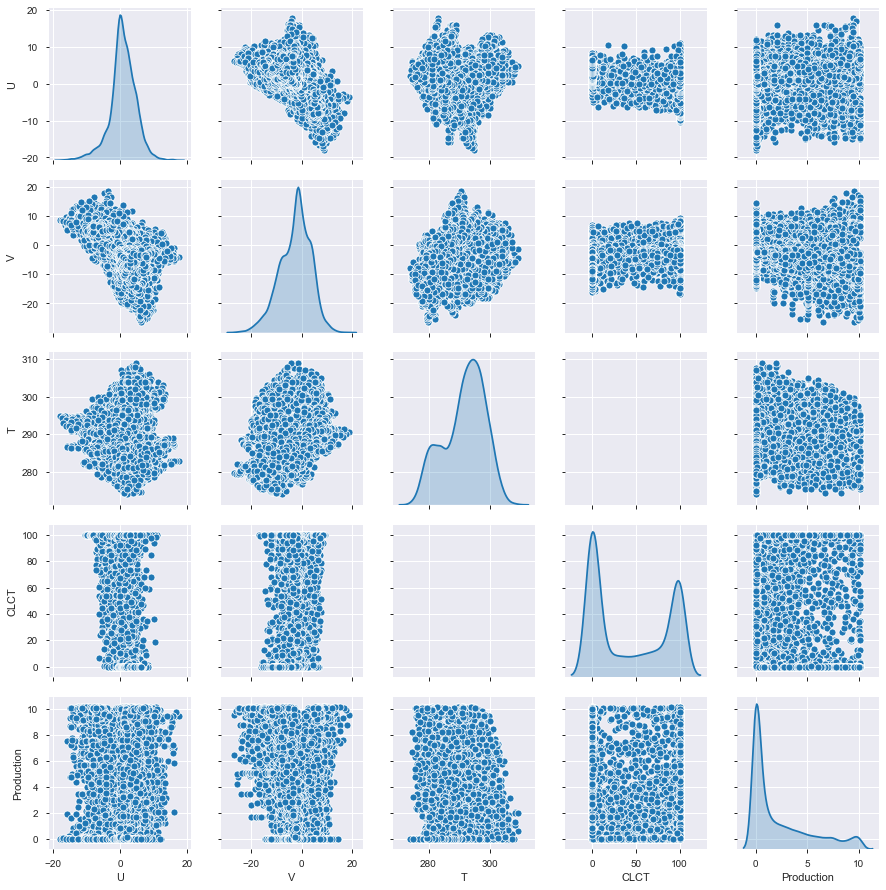

In [87]:
sns.pairplot(
    eda_df_rced,
    vars = ['U','V','T','CLCT','Production'],
    diag_kind='kde'
)

In [89]:
eda_df.corr().iplot(
    kind='heatmap', 
    colorscale='spectral',
    filename='cufflinks/simple-heatmap'
)

## Transformations identification
<a id="transformations"></a>

Several transformation identification:
* Input missing values
* Create new features:
    - Wind velocity module (`w_vel`)
    - Wind direction (`w_dir`)
    - Wind velocity escaled to heigth of the turbine (`w_vel_esc`). We can calculate it by using 
    
        $$u(z) = u(z_0)\left(\frac{z}{z_0}\right)^{\alpha},$$ 
      
      with $\alpha = 1/7$, $z_0 = 100$ or $10$ meters, depending on the Wild Farm, and $z = 50$ m, the height of the turbines.
    - New features with the mean values of meteorological variables for every Numerical Weather Predictor (`U`, `V`, `T`, `CLCT`)
    - Date time future enconding to capture seasonality (`month`, `day_of_month`, `hour`)
    - Cyclical enconding for wind direction and date time features.
* Stardard Scaling of variables
* Outlier treatment (to define, using the extra data in order to identify anomalies).
* Feature selection